In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from skimage.transform import resize
import cv2

from keras.models import Model,load_model
from keras.applications.inception_resnet_v2 import preprocess_input
from sklearn.metrics import accuracy_score,classification_report,ConfusionMatrixDisplay,confusion_matrix

2023-01-22 22:14:17.698581: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-01-22 22:14:17.769612: I tensorflow/core/util/port.cc:104] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-01-22 22:14:18.088575: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/mehathab/miniconda3/envs/corn_dev/lib/python3.8/site-packages/cv2/../../lib64::/home/mehatha

In [2]:
testdir = 'test/'
modeldir = 'models/'
models = os.listdir(modeldir)
weights = os.listdir('weights/')
best_weights = os.listdir('best_weights/')
model_space = ["BGR", "LAB_C", "LUV_C", "BGR_C", "HLS", "HLS_C", "RGB", "HSV_C"]
points = {model:{'N':0,'B':0} for model in models}
classes = ['Healthy', 'Sprayable', 'Non Sprayable' ]
models

['IncRes_BGR_model1.hdf5',
 'IncRes_LAB+contrast_model1.hdf5',
 'IncRes_LUV+contrast_model1.hdf5',
 'IncRes_BGR+Contrast_model1.hdf5',
 'IncRes_HLS_model1.hdf5',
 'IncRes_HLS+contrast_model1.hdf5',
 'IncRes_RGB_model1.hdf5',
 'IncRes_HSV+Contrast_model1.hdf5']

In [3]:
test_csv = pd.read_csv('test.csv')

x_test = test_csv['image_path']
y_test = test_csv['classification']
x_test

0              test/Healthy.jpg
1            test/Sprayable.jpg
2     test/Non_Sprayable_11.jpg
3     test/Non_Sprayable_12.jpg
4          test/Sprayable_6.jpg
5          test/Sprayable_2.jpg
6            test/Healthy_3.jpg
7          test/Sprayable_5.JPG
8          test/Sprayable_8.jpg
9      test/Non_Sprayable_4.jpg
10         test/Sprayable_9.jpg
11    test/Non_Sprayable_9.jpeg
12         test/Sprayable_3.jpg
13     test/Non_Sprayable_3.jpg
14     test/Non_Sprayable_5.jpg
15    test/Non_Sprayable_10.JPG
16     test/Non_Sprayable_2.jpg
17           test/Healthy_1.jpg
18         test/Sprayable_7.jpg
19           test/Healthy_2.jpg
20        test/Sprayable_10.jpg
21     test/Non_Sprayable_1.jpg
22     test/Non_Sprayable_6.jpg
23     test/Non_Sprayable_7.jpg
24         test/Sprayable_4.jpg
25           test/Healthy_4.jpg
26         test/Sprayable_1.jpg
27           test/Healthy_5.JPG
28        test/Sprayable_11.jpg
29     test/Non_Sprayable_8.JPG
Name: image_path, dtype: object

In [4]:
def contrast(img):
    # Contrast Streching
    img = img.astype('uint8')
    original = img.copy()
    xp = [0, 64, 128, 192, 255]
    fp = [0, 16, 128, 240, 255]
    x = np.arange(256)
    table = np.interp(x, xp, fp).astype('uint8')
    img = cv2.LUT(img, table)    
    return img

def colorspace(img,space):
    image = img.astype('uint8')
    if space =='HLS':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
    elif space =='HLS_C':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        img_convert = contrast(img_convert)
    elif space =='RGB':
        img_convert = image
    elif space =='RGB_C':
#         img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        img_convert = contrast(img_convert)
    elif space =='BGR':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    elif space =='BGR_C':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
        img_convert = contrast(img_convert)
    elif space =='LUV':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
    elif space =='LUV_C':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        img_convert = contrast(img_convert)
    elif space =='LAB':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    elif space =='LAB_C':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
        img_convert = contrast(img_convert)
    elif space =='YCrCb':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    elif space =='YCrCb_C':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        img_convert = contrast(img_convert)
    elif space =='HSV':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    elif space =='HSV_C':
        img_convert = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        img_convert = contrast(img_convert)
    else:
        pass
        
    return img_convert.astype('float32')

In [5]:
def resized(img,space):
    image = preprocess_input(colorspace(img,space))

    img_resize = resize(image,(299,299,3))
    return img_resize
    

In [6]:
def model_predictor(img,space):
    predict_list = []
    predict_prob = []
    
    image = plt.imread(img)
#     image_preprocessed = preprocess_input(image)
    image_resized = resized(image,space)    
    image_expand = np.expand_dims(image_resized,axis=0)
    
    predictions = model.predict(image_expand)
    flatten_predictions = list(predictions.flatten())
    predict_prob = flatten_predictions

#     predict_prob = list(np.mean(predict_prob, axis=0))
    print("Pred Prob:",predict_prob)

    sort_predictions = np.sort(np.array(predict_prob), axis=0)
    sort_predictions = sort_predictions[::-1]
#     print(sort_predictions)

    main_predict = predict_prob.index(sort_predictions[0])
    second_predict = predict_prob.index(sort_predictions[1])
    third_predict = predict_prob.index(sort_predictions[2])

    if sort_predictions[0]:
        predict_list.append(main_predict)
#         and (sort_predictions[0] * 10 < 9)
    if sort_predictions[1] and (sort_predictions[0] * 10 < 9.5):
        predict_list.append(second_predict)
#     if (sort_predictions[1] - sort_predictions[2] > 0.01) and (sort_predictions[2] * 100 > 1):
#         predict_list.append(third_predict)

    return [predict_list, predict_prob]

In [7]:
def predictor(image,space):
        predict, pred_prob = model_predictor(image,space)
        predicted_classes = [classes[i] for i in predict]
        return [predicted_classes, pred_prob]

In [8]:
# Sorting A Dictionary within a Dictionary with multiple values

# from operator import *
# def sort(d):
#     sort1 = sorted(d.items(),key=lambda x:getitem(x[1],'N'),reverse=True)
#     sort2 = sorted(d.items(),key=lambda x:getitem(x[1],'B'),reverse=True)
#     b = sort2[0][1]['B']
#     n = sort1[0][1]['N']
#     if n > b:
#         return sort1
#     else:
#         return sort2

test/Healthy.jpg


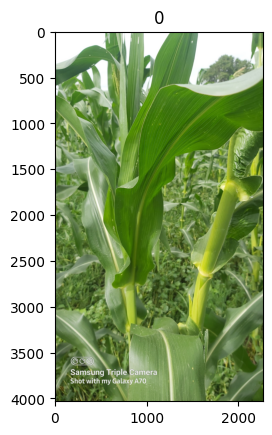

Model : IncRes_BGR_model1.hdf5


2023-01-22 22:14:19.423886: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-22 22:14:19.426887: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-22 22:14:19.427332: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2023-01-22 22:14:19.427722: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX_VNNI FMA
To enable them in other operations, rebuil

1/1 [==============================] - 4s 4s/step


2023-01-22 22:14:26.901211: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:630] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


Pred Prob: [1.0, 1.9036603e-10, 4.9517297e-08]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 1.9036603e-10, 4.9517297e-08]


Model : IncRes_LAB+contrast_model1.hdf5


/tmp/ipykernel_27716/3554457918.py:62: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if y_pred2 == y_test[i]:
/tmp/ipykernel_27716/3554457918.py:66: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if y_pred4 == y_test[i]:


1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 6.197224e-13, 1.9102957e-09]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 4.7627917e-13, 7.5788834e-11]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9999987, 1.1069354e-06, 2.3689519e-07]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9999989, 1.0927663e-06, 8.756197e-09]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 6.92383e-11, 8.313071e-10]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 9.70012e-12, 3.978919e-11]


Model : IncRes_HLS_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9999999, 7.6460796e-11, 1.61247e-07]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.989565, 0.0018000928, 0.008634832]


Model : IncRes_HLS+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred 

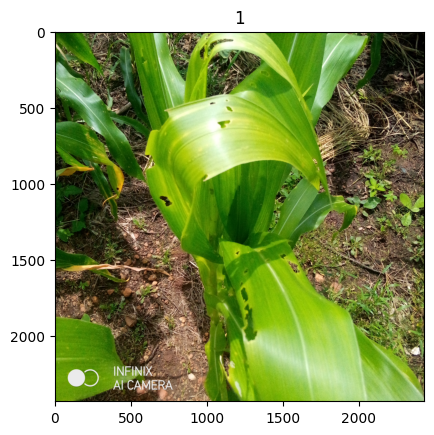

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.00015007726, 0.0006677614, 0.99918216]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.00015007726, 0.0006677614, 0.99918216]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.6772944e-05, 7.9302555e-07, 0.99996245]
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.4904598e-05, 5.656532e-08, 0.999985]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0018558563, 1.0680803e-07, 0.99814403]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.008293524, 3.5461034e-07, 0.99170613]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0015904492, 0.001994547, 0.996415]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0017200196, 0.0009207172, 0.9973592]


Model : IncRes_HLS_model1

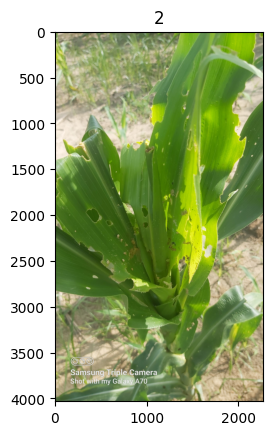

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [4.0513187e-06, 0.015444461, 0.9845515]
1/1 [==============================] - 1s 1s/step
Pred Prob: [4.0513187e-06, 0.015444461, 0.9845515]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [7.3920232e-06, 0.7602393, 0.23975326]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.791022e-05, 0.45405972, 0.5459224]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [3.1821498e-06, 0.7075118, 0.29248497]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.7926046e-06, 0.90484244, 0.09515569]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [9.3064125e-05, 0.015456402, 0.9844505]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.00027243717, 0.35175124, 0.64797634]


Model : IncRes_HLS_model1.hdf5
1/1 [=

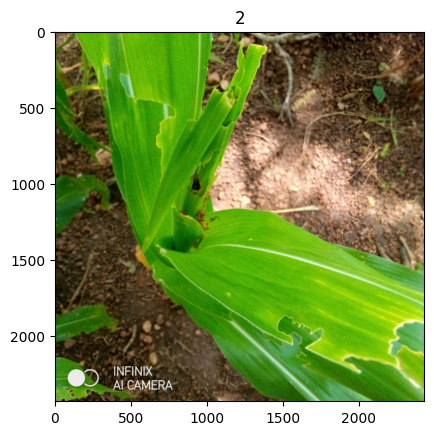

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.866174e-05, 0.967986, 0.031975403]
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.866174e-05, 0.967986, 0.031975403]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.0727645e-05, 0.037984416, 0.96200484]
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.1150829e-05, 0.014574571, 0.9854043]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [4.1727767e-06, 0.16414274, 0.83585304]
1/1 [==============================] - 2s 2s/step
Pred Prob: [9.052844e-06, 0.18167858, 0.8183124]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0003637604, 0.9793412, 0.020294994]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0011813431, 0.96083426, 0.037984293]


Model : IncRes_HLS_model1.hdf5
1/1 [===

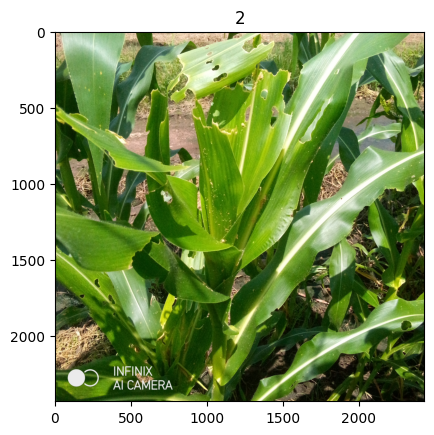

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0003227404, 0.06904232, 0.9306349]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0003227404, 0.06904232, 0.9306349]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.37258053, 0.016582465, 0.61083704]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.14283593, 0.008171632, 0.8489924]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0034374332, 9.439068e-05, 0.9964682]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.006211568, 7.6557635e-06, 0.9937808]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [9.9927274e-05, 6.5741166e-05, 0.9998343]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.00012323959, 2.4805038e-05, 0.99985194]


Model : IncRes_HLS_model1.hdf5
1/1 [=

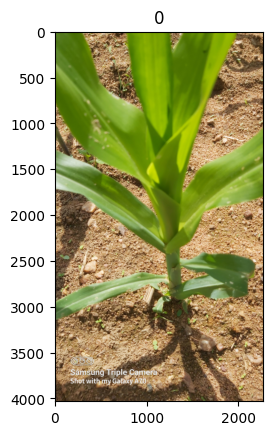

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 2.673095e-10, 4.1591385e-08]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 2.673095e-10, 4.1591385e-08]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.99999964, 4.81583e-08, 3.9200557e-07]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9999994, 5.808563e-07, 5.259887e-08]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.99999964, 1.2133371e-07, 2.6365188e-07]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9999995, 9.831634e-09, 4.931197e-07]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 3.8154112e-11, 1.4143579e-08]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 2.4207402e-11, 2.8599985e-08]


Model : IncRes_HLS_model1.hdf5
1/1 [===========

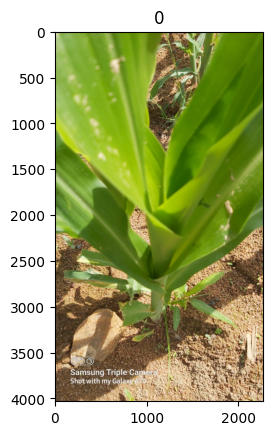

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9999995, 4.2073304e-07, 2.6632108e-10]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9999995, 4.2073304e-07, 2.6632108e-10]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.75724715, 0.24024686, 0.0025060081]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.59227574, 0.40689722, 0.0008269963]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9917637, 0.00823478, 1.4885195e-06]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.98400223, 0.015987445, 1.0352511e-05]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9997507, 0.0002476604, 1.7209436e-06]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.99915826, 0.0008340238, 7.792751e-06]


Model : IncRes_HLS_model1.hdf

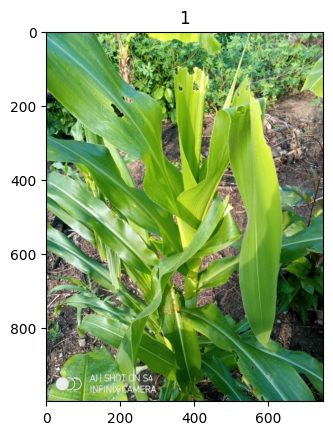

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.005176525, 0.011354536, 0.9834689]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.005176525, 0.011354536, 0.9834689]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.007316695, 0.00048161618, 0.9922017]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.009566437, 0.000894504, 0.9895391]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.97753155, 2.1150157e-05, 0.022447392]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9964426, 0.0023616967, 0.0011957288]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0009899032, 0.015333269, 0.9836768]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0008213776, 0.009976633, 0.989202]


Model : IncRes_HLS_model1.hdf5
1/1 [=====

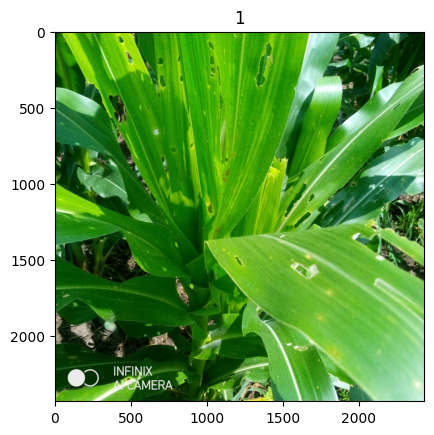

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0822775e-05, 0.010223626, 0.9897655]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0822775e-05, 0.010223626, 0.9897655]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [4.2748596e-07, 0.0009490697, 0.99905044]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0400693e-06, 0.0050303154, 0.9949687]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [4.261566e-05, 0.057808876, 0.94214857]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.0001438968, 0.08705876, 0.9127973]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [9.328213e-07, 0.00013300515, 0.999866]
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.0373614e-07, 1.135152e-06, 0.9999987]


Model : IncRes_HLS_model1.hdf5


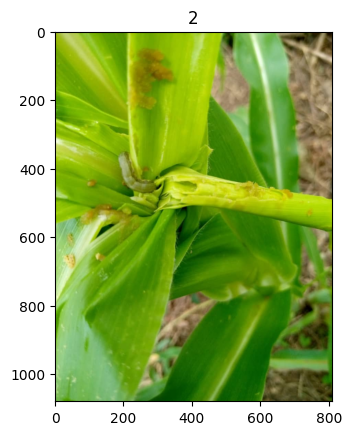

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.4922222e-05, 0.9787844, 0.021200683]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.4922222e-05, 0.9787844, 0.021200683]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [3.937283e-06, 0.6595317, 0.34046438]
1/1 [==============================] - 1s 1s/step
Pred Prob: [7.083461e-06, 0.71186256, 0.28813037]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [6.786296e-05, 0.046567388, 0.9533648]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.0013889073, 0.5295853, 0.46902582]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00030640524, 0.6468574, 0.35283616]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00038437644, 0.3777382, 0.62187743]


Model : IncRes_HLS_model1.hdf5
1/1 [=====

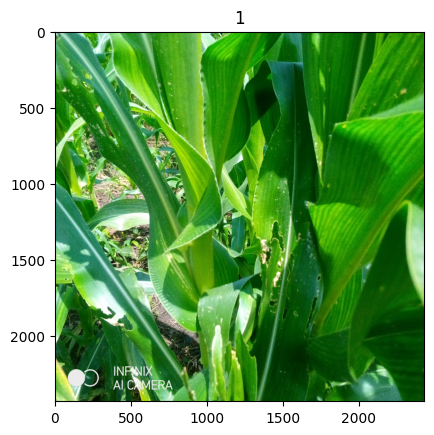

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.001401994, 0.62153214, 0.37706593]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.001401994, 0.62153214, 0.37706593]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9956951, 0.00013457704, 0.0041703265]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.99653995, 0.00023662187, 0.003223434]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.049412966, 0.008463691, 0.94212335]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.122272, 0.0070301024, 0.87069786]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.0048019257, 0.97083575, 0.024362331]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.087000035, 0.7312843, 0.1817156]


Model : IncRes_HLS_model1.hdf5
1/1 [=======

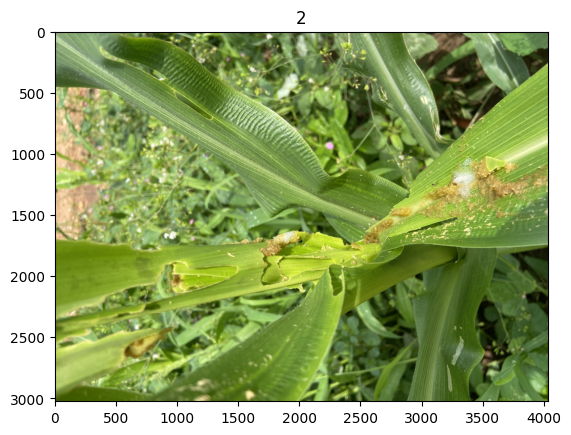

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.9520103e-07, 0.9997286, 0.00027106432]
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.9520103e-07, 0.9997286, 0.00027106432]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.1485018e-06, 0.90309846, 0.09690033]
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.954395e-06, 0.42355913, 0.5764369]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.8215512e-07, 0.99838185, 0.0016178336]
1/1 [==============================] - 1s 1s/step
Pred Prob: [2.1645712e-06, 0.976253, 0.023744825]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [2.8699173e-05, 0.96264094, 0.03733037]
1/1 [==============================] - 1s 1s/step
Pred Prob: [2.3134984e-05, 0.9446012, 0.05537575]


Model : IncRes_HLS_model1.hdf5


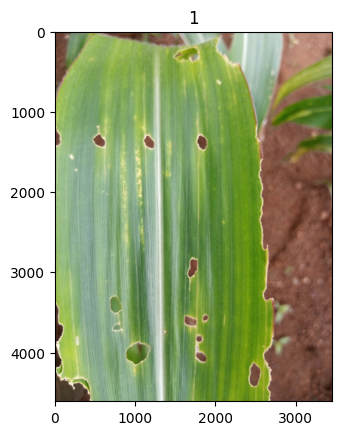

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.2311784e-08, 9.4826845e-08, 0.9999999]
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.2311784e-08, 9.4826845e-08, 0.9999999]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [5.532806e-08, 1.8991572e-05, 0.9999809]
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.2278147e-07, 5.393583e-05, 0.9999459]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.0765711e-06, 3.807413e-07, 0.99999654]
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.400732e-06, 3.528171e-08, 0.9999976]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [8.940942e-08, 5.9288286e-06, 0.99999404]
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.068187e-07, 2.8270072e-06, 0.999997]


Model : IncRes_HLS_mode

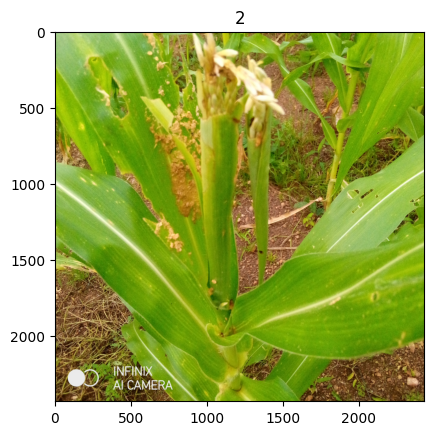

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [5.6927723e-07, 0.9337968, 0.06620259]
1/1 [==============================] - 2s 2s/step
Pred Prob: [5.6927723e-07, 0.9337968, 0.06620259]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.288218e-05, 0.99518025, 0.004796848]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00012661087, 0.88898575, 0.11088762]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [4.2952297e-06, 0.9118095, 0.0881862]
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.11359e-05, 0.90366167, 0.09632727]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.2500105e-05, 0.40374482, 0.59619266]
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.2243967e-05, 0.17604087, 0.8239469]


Model : IncRes_HLS_model1.hdf5
1/1 [====

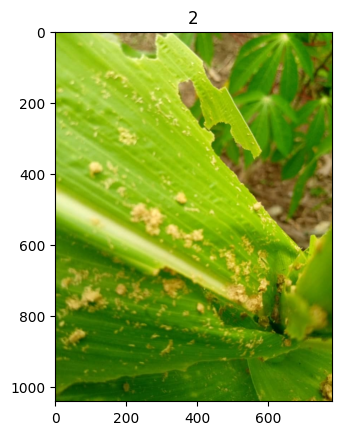

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [6.9849317e-09, 0.9991115, 0.000888487]
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.9849317e-09, 0.9991115, 0.000888487]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [5.6373486e-11, 0.99999976, 2.697146e-07]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.8821053e-10, 0.99999547, 4.509931e-06]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [7.4608077e-13, 1.0, 5.9167926e-10]
1/1 [==============================] - 2s 2s/step
Pred Prob: [4.0038337e-12, 0.9999999, 7.29321e-08]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [4.3002965e-10, 0.9999794, 2.0574958e-05]
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.7581485e-10, 0.9999684, 3.1641433e-05]


Model : IncRes_HLS_model1.hdf

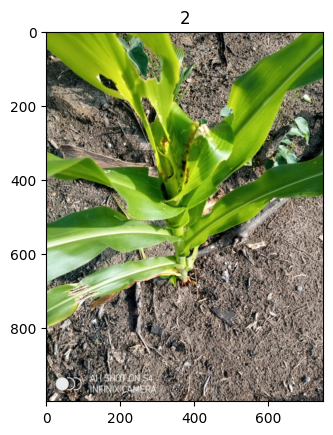

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.052831717, 0.05604739, 0.891121]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.052831717, 0.05604739, 0.891121]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.0013302438, 0.0930043, 0.9056655]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.0023826554, 0.040830746, 0.9567866]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.20108168, 5.4308006e-05, 0.798864]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.39217883, 0.0003821183, 0.60743904]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.48016304, 0.0021474147, 0.5176896]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.35576537, 0.008148423, 0.63608617]


Model : IncRes_HLS_model1.hdf5
1/1 [================

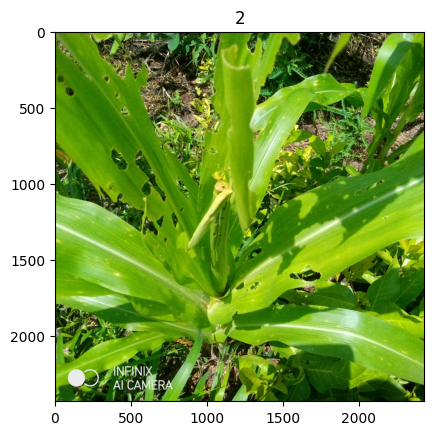

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [8.683322e-05, 0.00069188065, 0.9992213]
1/1 [==============================] - 2s 2s/step
Pred Prob: [8.683322e-05, 0.00069188065, 0.9992213]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [8.396667e-05, 0.5938795, 0.40603653]
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.622493e-05, 0.53793687, 0.4619969]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.5913964e-05, 0.1525491, 0.847435]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00012775736, 0.31873736, 0.6811349]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.5265707e-06, 0.0005526903, 0.9994438]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.326987e-05, 0.0028243903, 0.9971623]


Model : IncRes_HLS_model1.hdf5
1/1 [==

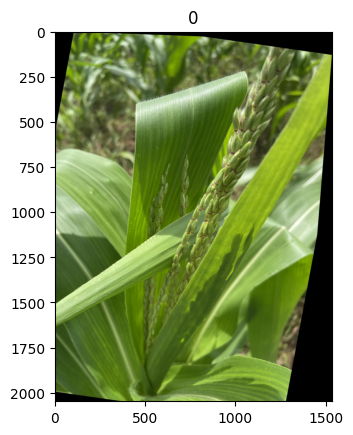

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0007086927, 1.5603495e-06, 0.99928975]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0007086927, 1.5603495e-06, 0.99928975]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0003291461, 3.817821e-05, 0.9996327]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.00025184595, 1.165645e-05, 0.9997365]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.3516726e-05, 2.6482556e-07, 0.9999763]
1/1 [==============================] - 2s 2s/step
Pred Prob: [5.757849e-05, 1.5311259e-06, 0.9999409]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0013080024, 3.68387e-05, 0.9986551]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0017229196, 0.00013906624, 0.99813795]


Model : IncRes_HLS_model

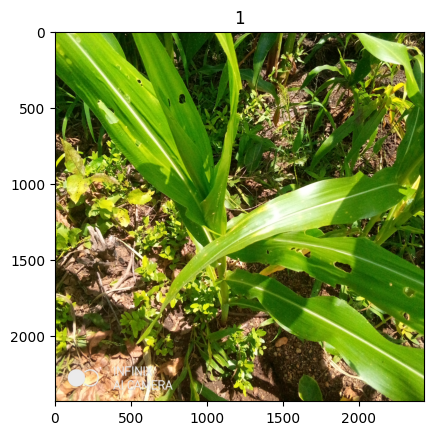

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.86766064, 0.09110693, 0.041232392]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.86766064, 0.09110693, 0.041232392]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.5567661, 6.0075477e-06, 0.4432279]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.5168794, 0.0026707123, 0.48044994]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.002461703, 1.3040086e-05, 0.9975253]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.011754551, 2.9696583e-05, 0.9882158]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.82285017, 0.0059484155, 0.17120136]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9211536, 0.002236743, 0.07660969]


Model : IncRes_HLS_model1.hdf5
1/1 [=========

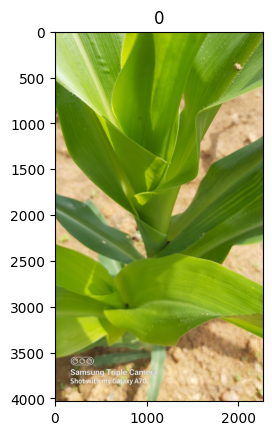

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 9.20643e-11, 6.229269e-13]
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.0, 9.20643e-11, 6.229269e-13]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.9999999, 3.094078e-11, 6.970349e-08]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.99999917, 2.2354314e-09, 8.253695e-07]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 7.075847e-09, 1.4578466e-08]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 1.5110535e-08, 2.7352034e-09]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 8.220185e-14, 4.5511864e-16]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.0, 2.2778874e-14, 5.84879e-16]


Model : IncRes_HLS_model1.hdf5
1/1 [=============================

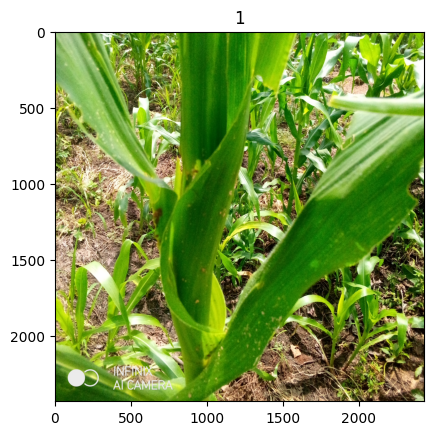

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.004965831, 0.38116172, 0.6138724]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.004965831, 0.38116172, 0.6138724]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00065686996, 0.100403465, 0.8989396]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0029727407, 0.32702345, 0.6700038]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.32126266, 0.0010076277, 0.6777297]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.7508188, 0.0006934429, 0.24848773]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.0023811085, 0.9892498, 0.008369146]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0051122033, 0.93307203, 0.061815783]


Model : IncRes_HLS_model1.hdf5
1/1 [==========

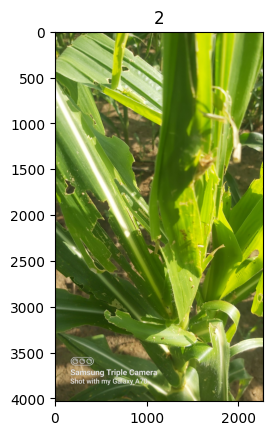

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.9529624e-06, 0.37420556, 0.62579155]
1/1 [==============================] - 2s 2s/step
Pred Prob: [2.9529624e-06, 0.37420556, 0.62579155]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.3134611e-07, 0.9949714, 0.005028241]
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.1822216e-06, 0.93822765, 0.061771102]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.7541193e-07, 0.9996307, 0.00036912633]
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.1018797e-06, 0.9949292, 0.005069727]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.8652041e-06, 0.40435442, 0.59564364]
1/1 [==============================] - 1s 1s/step
Pred Prob: [2.032237e-06, 0.7396952, 0.26030272]


Model : IncRes_HLS_model1.hdf5
1

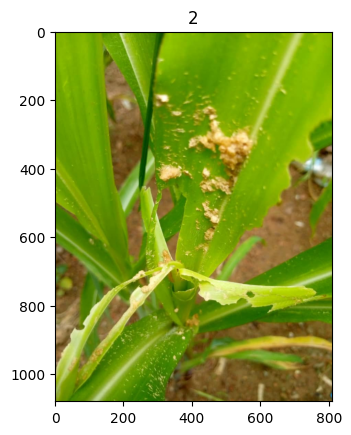

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.39065e-08, 0.9999988, 1.1259307e-06]
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.39065e-08, 0.9999988, 1.1259307e-06]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.0062214e-06, 0.001668856, 0.9983302]
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.3255278e-06, 0.0023743392, 0.9976223]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.7840734e-05, 0.21626808, 0.78371406]
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.2765925e-05, 0.4100865, 0.5898507]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.6340941e-08, 1.0, 1.3701028e-08]
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.3729445e-08, 0.99999964, 2.2971489e-07]


Model : IncRes_HLS_model1.hdf5
1/1 

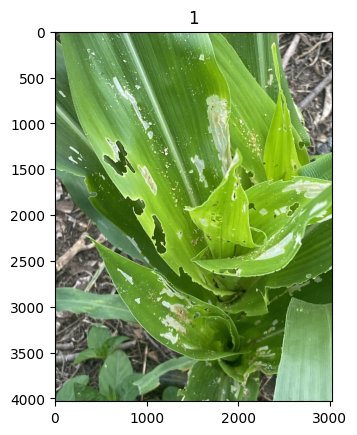

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [8.593686e-09, 0.972801, 0.02719899]
1/1 [==============================] - 1s 1s/step
Pred Prob: [8.593686e-09, 0.972801, 0.02719899]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [7.2776615e-08, 0.27794155, 0.7220584]
1/1 [==============================] - 1s 1s/step
Pred Prob: [2.733893e-08, 0.015316679, 0.98468333]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.0051004e-09, 0.052769456, 0.9472305]
1/1 [==============================] - 2s 2s/step
Pred Prob: [6.133958e-09, 0.00790878, 0.9920912]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [4.4919425e-08, 0.97941935, 0.020580666]
1/1 [==============================] - 2s 2s/step
Pred Prob: [3.454965e-08, 0.99392056, 0.006079452]


Model : IncRes_HLS_model1.hdf5
1/1 [=====

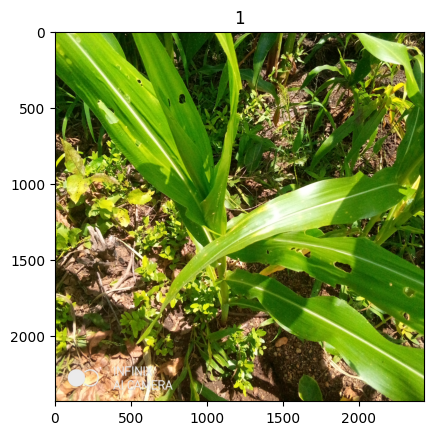

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.86766064, 0.09110693, 0.041232392]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.86766064, 0.09110693, 0.041232392]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.5567661, 6.0075477e-06, 0.4432279]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.5168794, 0.0026707123, 0.48044994]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.002461703, 1.3040086e-05, 0.9975253]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.011754551, 2.9696583e-05, 0.9882158]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.82285017, 0.0059484155, 0.17120136]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9211536, 0.002236743, 0.07660969]


Model : IncRes_HLS_model1.hdf5
1/1 [=========

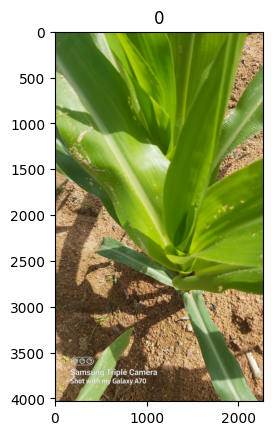

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9999995, 4.344814e-10, 4.927549e-07]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9999995, 4.344814e-10, 4.927549e-07]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.99999976, 2.3204155e-13, 2.4547657e-07]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.99999976, 3.7126786e-12, 2.721301e-07]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.99953103, 2.2216454e-08, 0.00046900313]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9999691, 9.0668335e-09, 3.0866096e-05]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [1.0, 2.0664578e-11, 5.7495768e-08]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.9999969, 2.864037e-10, 3.067423e-06]


Model : IncRes_HLS_model1.h

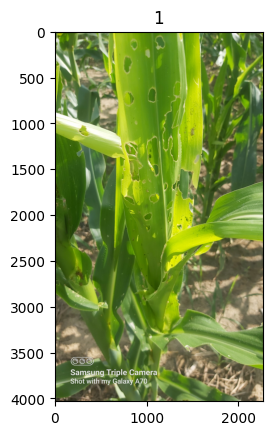

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [7.5796324e-06, 0.11679927, 0.88319314]
1/1 [==============================] - 2s 2s/step
Pred Prob: [7.5796324e-06, 0.11679927, 0.88319314]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [8.231902e-06, 0.2377421, 0.76224965]
1/1 [==============================] - 2s 2s/step
Pred Prob: [7.2118946e-06, 0.09255624, 0.9074365]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [8.964195e-05, 0.6042852, 0.3956252]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0001451476, 0.59240216, 0.4074527]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [1.1612615e-05, 0.16360174, 0.8363867]
1/1 [==============================] - 1s 1s/step
Pred Prob: [2.0521478e-05, 0.72820634, 0.27177313]


Model : IncRes_HLS_model1.hdf5
1/1 [======

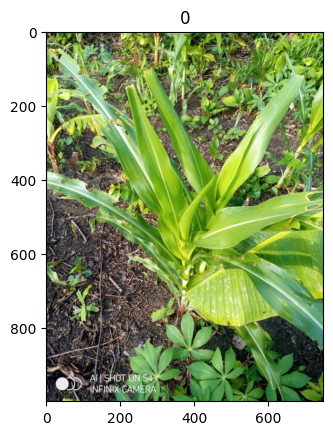

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.064843476, 0.0039213956, 0.93123513]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.064843476, 0.0039213956, 0.93123513]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.13607737, 0.00011283234, 0.86380976]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.81293505, 0.0025162043, 0.18454877]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.05773645, 0.000370429, 0.94189316]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.36824283, 0.0061211437, 0.62563604]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.38730675, 0.21390563, 0.39878765]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.46067056, 0.31423643, 0.22509307]


Model : IncRes_HLS_model1.hdf5
1/1 [=======

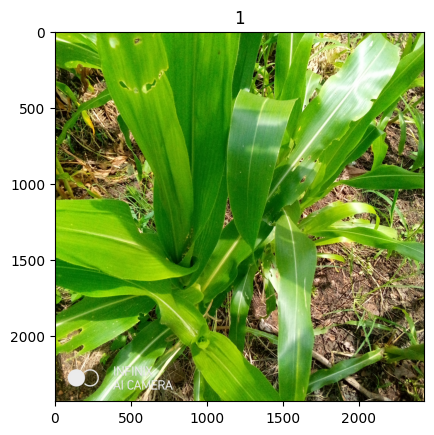

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.012203693, 0.005157503, 0.98263884]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.012203693, 0.005157503, 0.98263884]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.13694793, 2.203577e-05, 0.86303]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.30166024, 0.00047233645, 0.69786745]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.023799732, 3.7346825e-05, 0.9761629]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0969553, 7.695346e-05, 0.9029677]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.0119942, 0.0033045951, 0.9847013]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.010283685, 0.00030097333, 0.9894154]


Model : IncRes_HLS_model1.hdf5
1/1 [=========

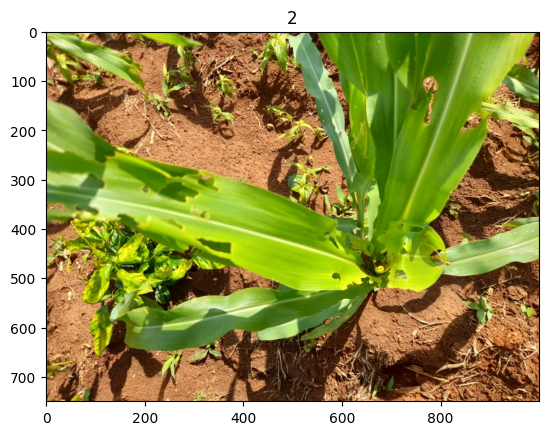

Model : IncRes_BGR_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.081626914, 0.9176119, 0.00076124765]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.081626914, 0.9176119, 0.00076124765]


Model : IncRes_LAB+contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00019312768, 0.7738044, 0.22600237]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00026482154, 0.4769169, 0.52281827]


Model : IncRes_LUV+contrast_model1.hdf5
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.00037987478, 0.47880858, 0.52081156]
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.00040866042, 0.5125352, 0.4870561]


Model : IncRes_BGR+Contrast_model1.hdf5
1/1 [==============================] - 1s 1s/step
Pred Prob: [0.08701986, 0.1134767, 0.7995035]
1/1 [==============================] - 2s 2s/step
Pred Prob: [0.2640997, 0.11351587, 0.6223844]


Model : IncRes_HLS_model1.hdf5
1/1 [===========

In [9]:
for i,img in enumerate(x_test):
    image_path = img
    print(image_path)
    plt.imshow(plt.imread(image_path))
    plt.title(y_test[i])
    plt.show()
    
    
    for m,model_name in enumerate(models):
        print("Model :",model_name)
        
        model_nweight = 'weights/'+ weights[weights.index(model_name)]
        model_bweight = 'best_weights/'+ best_weights[best_weights.index(model_name)]
#         print("N",model_nweight)
#         print("B",model_bweight)
#         print(model_name)

        model = load_model(modeldir+model_name)
        model.load_weights(model_nweight)
        
#         y_pred = []
        predictions,preds = predictor(image_path,model_space[m])
        y_pred1 = classes.index(predictions[0])
        try:
            y_pred2 = classes.index(predictions[1])
        except:
            y_pred2 = []
        
#         print("Model:",model_name," with NWeight:")
#         print("Real: ",y_test[i]," Predicted 1:",y_pred1," Predicted 2:",y_pred2)
        
        
        
        
        model = load_model(modeldir+model_name)
        model.load_weights(model_bweight)
        
#         y_pred = []
        predictions,preds = predictor(image_path,model_space[m])
        y_pred3 = classes.index(predictions[0])
        try:
            y_pred4 = classes.index(predictions[1])
        except:
            y_pred4 = []
        
#         print("Model:",model_name," with BWeight:")
#         print("Real: ",y_test[i]," Predicted 1:",y_pred1," Predicted 2:",y_pred2)
#         print("\n\n")
        
            
            
#     #     print(image_path,": Predicted :",y_pred1, y_pred2, "Real :",y_test[i])
#         if y_pred1 == y_test[i]:
#             y_pred.append(y_pred1)
#         elif y_pred2 == y_test[i]:
#             y_pred.append(y_pred2)
#         else:
#             y_pred.append(y_pred1)
        
        if y_pred1 == y_test[i]:
            points[model_name]['N'] += 3
        if y_pred2 == y_test[i]:
            points[model_name]['N'] += 2
        if y_pred3 == y_test[i]:
            points[model_name]['B'] += 3
        if y_pred4 == y_test[i]:
            points[model_name]['B'] += 2        
        print("\n")
        
#     print("Image",i+1," ",sorted(points.items(), key=lambda x: x[1], reverse=True),"\n\n")    
#     print("Image",i+1," Points :",sorted(points.items(),key=lambda x:points[x]['B']))
    print("Image",i+1," Points :",points,"\n")
        
        